# Preprocessing Cleaned Dataset

In [12]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [13]:
df = pd.read_csv("MBTI.csv", index_col = 0)

In [14]:
df.head()

,Tag,Cleaned_Text,Cleaned_Text_No_Emoticon,Text_stemmed,Bigram,Reddit,Twitter,Typology,Kaggle
0,ENFJ,memeincorrect quote sure trying keep peace family,memeincorrect quote sure trying keep peace family,memeincorrect quot sure tri peac famili,memeincorrect quote sure trying keep_peace family,1,0,0,0
1,ENTP,memefour distinct flavors nt,memefour distinct flavors nt,memefour distinct flavor,memefour distinct flavors nt,1,0,0,0
2,ENTP,memethis definitely intp looks like,memethis definitely intp looks like,memethi definit intp look like,memethis definitely intp looks_like,1,0,0,0
3,ISFJ,theory questionwhat type admire,theory questionwhat type admire,theori questionwhat type admir,theory_questionwhat type admire,1,0,0,0
4,ISTJ,memeistj x enfp real,memeistj x enfp real,memeistj enfp real,memeistj x enfp real,1,0,0,0


In [15]:
len(df)

134813

In [16]:
print("Number of personalities types in dataset is ", len(set(df.Tag.values)))
print("List of personalities types: ", list(set(df.Tag.values)))

Number of personalities types in dataset is  17
List of personalities types:  ['MBTI', 'ISTP', 'ISFP', 'ISTJ', 'ESTJ', 'INFJ', 'INTP', 'ENTP', 'INFP', 'ESTP', 'ESFP', 'ISFJ', 'INTJ', 'ENTJ', 'ENFJ', 'ESFJ', 'ENFP']


In [17]:
mbti_tag_index = df.index[df['Tag'] == "MBTI"]
print("No. of data with MBTI as a tag is ", len(mbti_tag_index))

No. of data with MBTI as a tag is  49


In [18]:
df = df.drop(mbti_tag_index)
len(df)

134764

# EDA

In [19]:
df['Cleaned_Text'] = df['Cleaned_Text'].astype(str)

In [20]:
df_grouped = df[['Tag','Cleaned_Text']].groupby('Tag').agg(lambda x: ' '.join(x))
df_grouped

,Cleaned_Text
Tag,
ENFJ,memeincorrect quote sure trying keep peace fam...
ENFP,theory questionwhy intjs seem much emotional i...
ENTJ,advicesupportmost accurate nonbiased mbticogni...
ENTP,memefour distinct flavors nt memethis definite...
ESFJ,memestereotype memes gonna get whole comment s...
ESFP,theory questionbeating te dom discussionare re...
ESTJ,memehopping onto bandwagon site addicting pers...
ESTP,stereotypesfi dumbest function memewhat say ri...
INFJ,memeyou learn something new everyday personali...


In [21]:
# Creating Document Term Matrix
from sklearn.feature_extraction.text import CountVectorizer 
cv=CountVectorizer(analyzer='word')
data=cv.fit_transform(df_grouped['Cleaned_Text'])
df_dtm = pd.DataFrame(data.toarray(), columns=cv.get_feature_names())
df_dtm.index=df_grouped.index
df_dtm.head(3)

,00,000,0000,00000,000000,0000000,000000000,000000000000000,00000000000000000000000000000000000000000000000,00000000000000000001,...,zzzvader,zzzz,zzzzaaaaaaiinnnn,zzzzz,zzzzzawesome,zzzzzzzz,zzzzzzzzcongratulations,zzzzzzzzlol,zzzzzzzzzzz,zzzzzzzzzzzzzzzzzzzzzzzzzzzzzz
Tag,,,,,,,,,,,,,,,,,,,,,
ENFJ,2,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ENFP,5,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
ENTJ,0,8,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


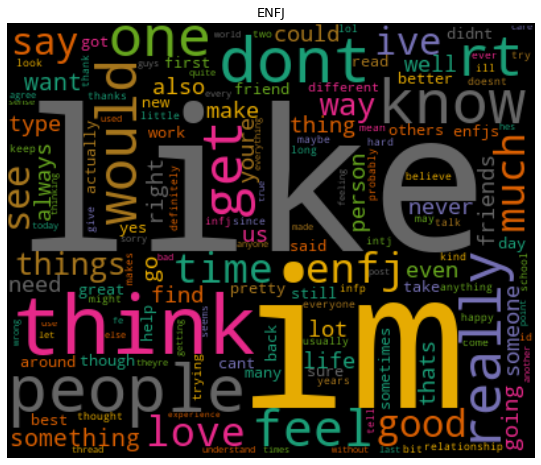

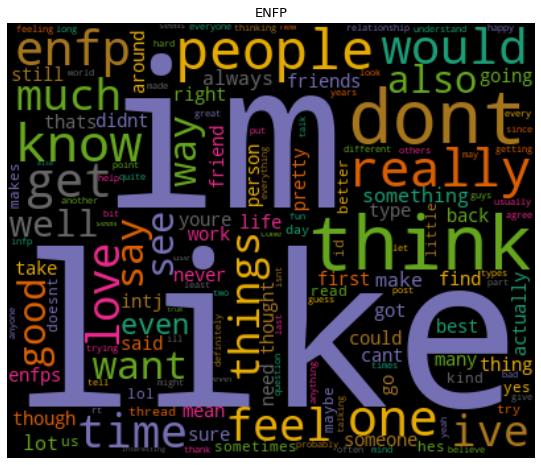

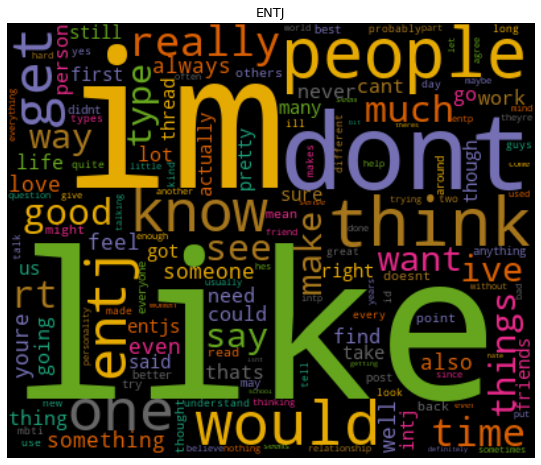

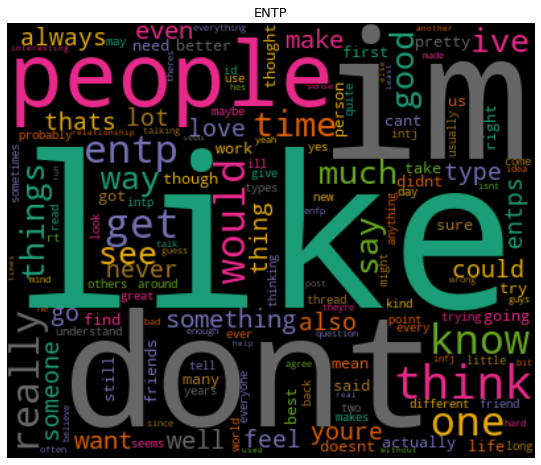

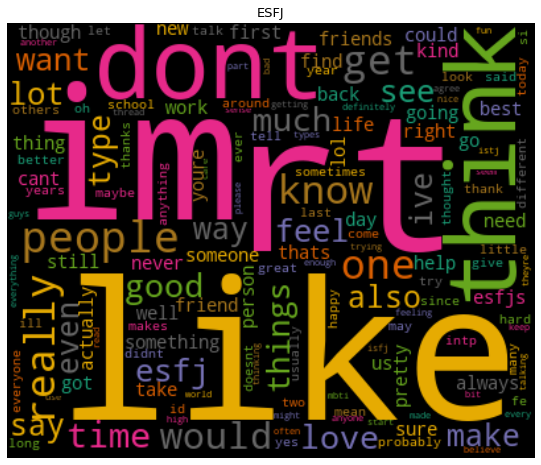

...

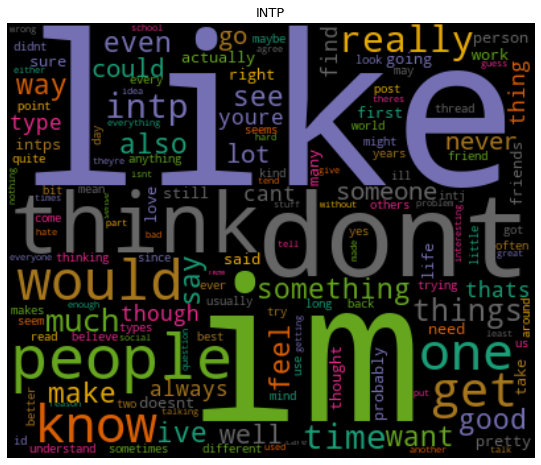

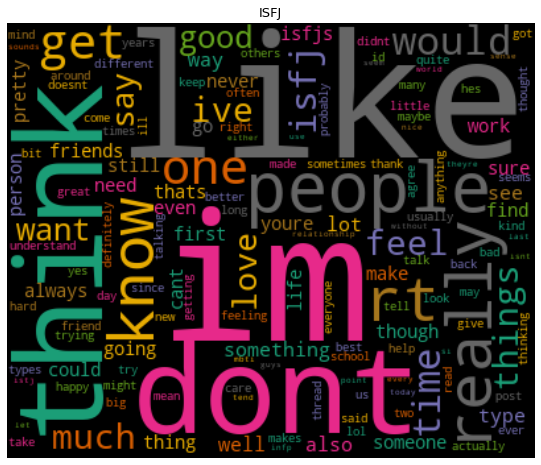

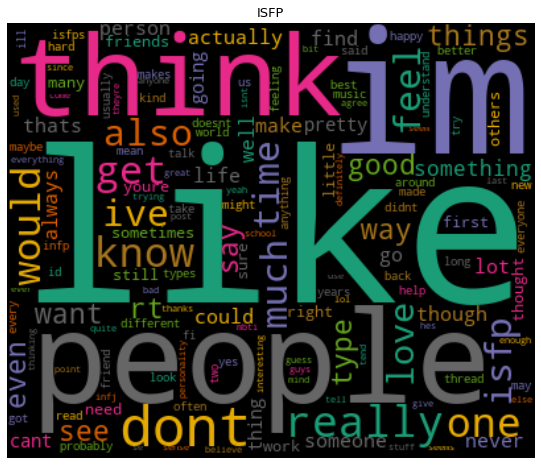

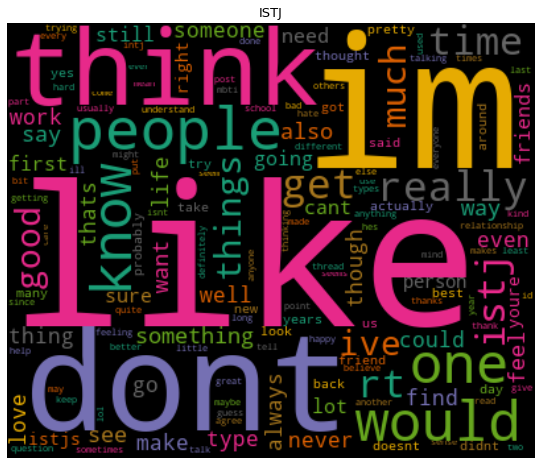

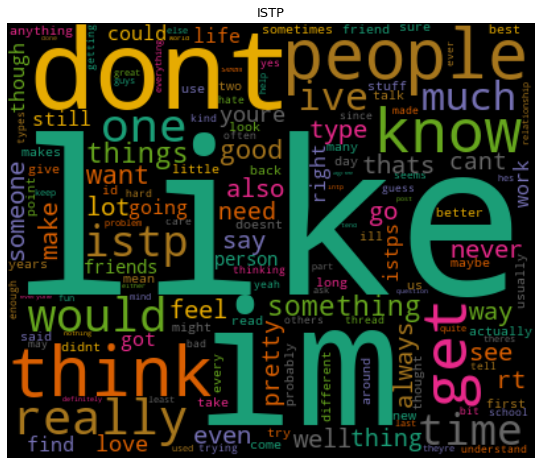

In [22]:
# Importing wordcloud for plotting word clouds and textwrap for wrapping longer text
from wordcloud import WordCloud
from textwrap import wrap

# Function for generating word clouds
def generate_wordcloud(data,title):
    wc = WordCloud(width=400, height=330, max_words=150,colormap="Dark2").generate_from_frequencies(data)
    plt.figure(figsize=(10,8))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis("off")
    plt.title('\n'.join(wrap(title,60)),fontsize=13)
    plt.show()
  
# Transposing document term matrix
df_dtm=df_dtm.transpose()

# Plotting word cloud for each product
for index,personality in enumerate(df_dtm.columns):
    generate_wordcloud(df_dtm[personality].sort_values(ascending=False),personality)

In [23]:
from textblob import TextBlob
df['polarity']=df['Cleaned_Text'].apply(lambda x:TextBlob(x).sentiment.polarity)

In [24]:
print("3 Random Reviews with Highest Polarity:")
for index,review in enumerate(df.iloc[df['polarity'].sort_values(ascending=False)[:3].index]['Cleaned_Text']):
    print('Review {}:\n'.format(index+1),review)

3 Random Reviews with Highest Polarity:
Review 1:
 one common link bjp govt every policy past 6 years disruption demonetisation
Review 2:
 imbueenfp omg hello hi welcome back hope okay
Review 3:
 youre pretty selfie spam like subs im always missing memo haha


In [25]:
print("3 Random Reviews with Lowest Polarity:")
for index,review in enumerate(df.iloc[df['polarity'].sort_values(ascending=True)[:3].index]['Cleaned_Text']):
    print('Review {}:\n'.format(index+1),review)

3 Random Reviews with Lowest Polarity:
Review 1:
 yeah thats real answer thats fitting descriptive model doesnt explain anything guess theories could categorized thats another topic ill try get intothe question make sense warm side congruent cold analytical side great challenge every entp address hisher say hir quest growthof course processes fe purely right brained essence dont necessarily mean actually mainly processed right brain continuous rather discreet outputs making harder discreetobject oriented analytical ti approach deconstruct set base principles dynamics hence dont know partthe dont know part course also perhapswell ill speak bit experiencei tend point oblivious people think whichs oddest thing know easy read people like nature habits highly correlated developmental reasons obviously thought processes excludes picture comes analysis
Review 2:
 tell probably never actually fell tree chainsaw cause yk would seem like know handle better could know technically knowing somethin

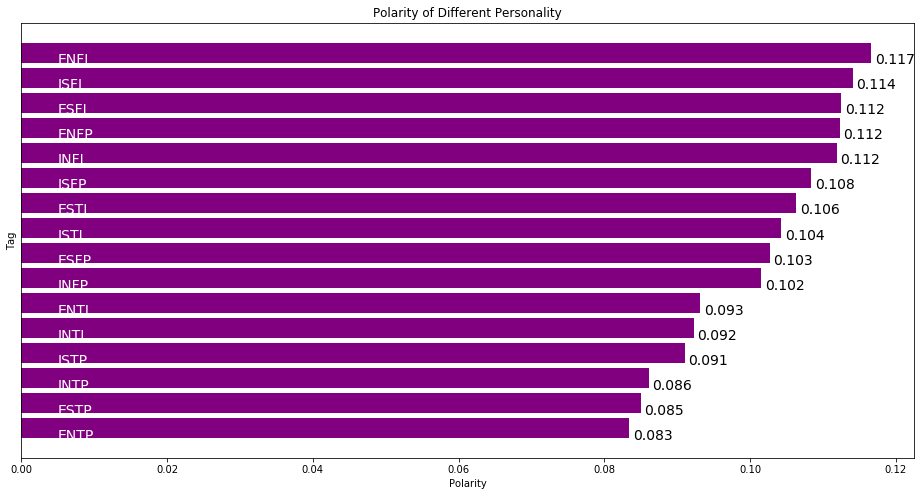

In [26]:
personality_polarity_sorted=pd.DataFrame(df.groupby('Tag')['polarity'].mean().sort_values(ascending=True))

plt.figure(figsize=(16,8))
plt.xlabel('Polarity')
plt.ylabel('Tag')
plt.title('Polarity of Different Personality')
polarity_graph=plt.barh(np.arange(len(personality_polarity_sorted.index)),personality_polarity_sorted['polarity'],color='purple',)

# Writing product names on bar
for bar,personality in zip(polarity_graph,personality_polarity_sorted.index):
    plt.text(0.005,bar.get_y()+bar.get_width(),'{}'.format(personality),va='center',fontsize=14,color='white')

# Writing polarity values on graph
for bar,polarity in zip(polarity_graph,personality_polarity_sorted['polarity']):
    plt.text(bar.get_width()+0.0005,bar.get_y()+bar.get_width(),'%.3f'%polarity,va='center',fontsize=14,color='black')

plt.yticks([])
plt.show()

In [27]:
INFP_data_index = df.index[df['Tag'] == "INFP"]
INFP_data = df.loc[INFP_data_index,:].reset_index(drop = True)

ENTJ_data_index = df.index[df['Tag'] == "ENTJ"]
ENTJ_data = df.loc[ENTJ_data_index,:].reset_index(drop = True)

ESFJ_data_index = df.index[df['Tag'] == "ESFJ"]
ESFJ_data = df.loc[ESFJ_data_index,:].reset_index(drop = True)

ESTJ_data_index = df.index[df['Tag'] == "ESTJ"]
ESTJ_data = df.loc[ESTJ_data_index,:].reset_index(drop = True)

INFJ_data_index = df.index[df['Tag'] == "INFJ"]
INFJ_data = df.loc[INFJ_data_index,:].reset_index(drop = True)

ISFJ_data_index = df.index[df['Tag'] == "ISFJ"]
ISFJ_data = df.loc[ISFJ_data_index,:].reset_index(drop = True)

INTJ_data_index = df.index[df['Tag'] == "INTJ"]
INTJ_data = df.loc[INTJ_data_index,:].reset_index(drop = True)

ENFP_data_index = df.index[df['Tag'] == "ENFP"]
ENFP_data = df.loc[ENFP_data_index,:].reset_index(drop = True)

ENTP_data_index = df.index[df['Tag'] == "ENTP"]
ENTP_data = df.loc[ENTP_data_index,:].reset_index(drop = True)

ISTP_data_index = df.index[df['Tag'] == "ISTP"]
ISTP_data = df.loc[ISTP_data_index,:].reset_index(drop = True)

ISFP_data_index = df.index[df['Tag'] == "ISFP"]
ISFP_data = df.loc[ISFP_data_index,:].reset_index(drop = True)

ESTP_data_index = df.index[df['Tag'] == "ESTP"]
ESTP_data = df.loc[ESTP_data_index,:].reset_index(drop = True)

INTP_data_index = df.index[df['Tag'] == "INTP"]
INTP_data = df.loc[INTP_data_index,:].reset_index(drop = True)

ENFJ_data_index = df.index[df['Tag'] == "ENFJ"]
ENFJ_data = df.loc[ENFJ_data_index,:].reset_index(drop = True)

ESFP_data_index = df.index[df['Tag'] == "ESFP"]
ESFP_data = df.loc[ESFP_data_index,:].reset_index(drop = True)

ISTJ_data_index = df.index[df['Tag'] == "ISTJ"]
ISTJ_data = df.loc[ISTJ_data_index,:].reset_index(drop = True)

In [28]:
import texthero as hero

In [29]:
personality_data = [INFP_data, ENTJ_data, ESFJ_data, ESTJ_data, INFJ_data, ISFJ_data, INTJ_data, ENFP_data,
                   ENTP_data, ISTP_data, ISFP_data, ESTP_data, INTP_data, ENFJ_data, ESFP_data, ISTJ_data]

for data in personality_data:
    tag = data.loc[0,'Tag']
    no_data = len(data)
    print(no_data, " number of data in ", tag, " data")

10345  number of data in  INFP  data
6275  number of data in  ENTJ  data
4960  number of data in  ESFJ  data
5744  number of data in  ESTJ  data
12063  number of data in  INFJ  data
5425  number of data in  ISFJ  data
15680  number of data in  INTJ  data
10878  number of data in  ENFP  data
13937  number of data in  ENTP  data
6895  number of data in  ISTP  data
5721  number of data in  ISFP  data
4392  number of data in  ESTP  data
17590  number of data in  INTP  data
4623  number of data in  ENFJ  data
4686  number of data in  ESFP  data
5550  number of data in  ISTJ  data


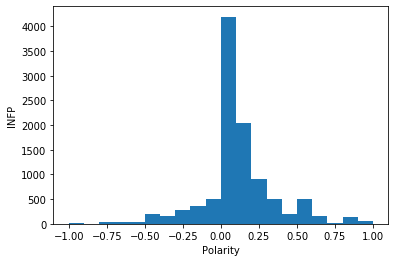

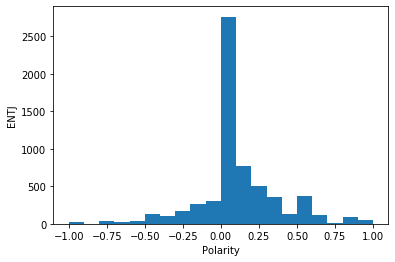

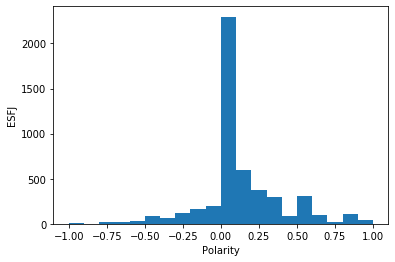

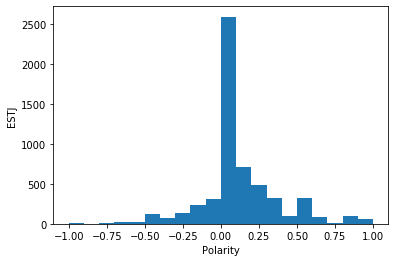

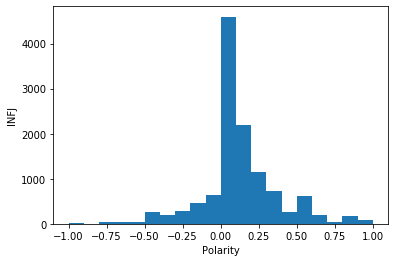

...

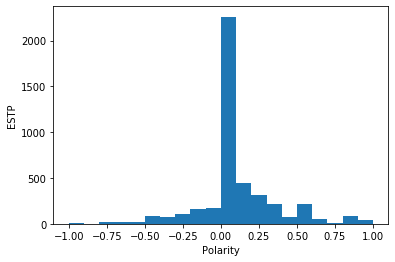

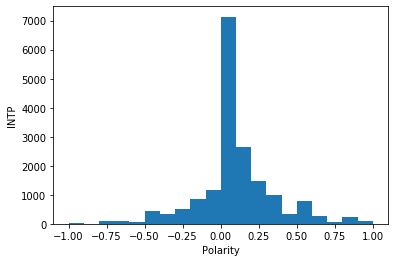

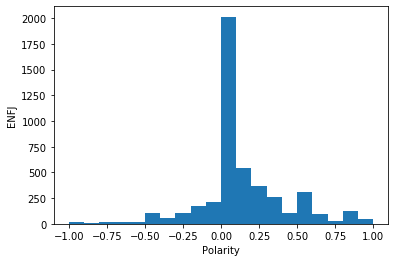

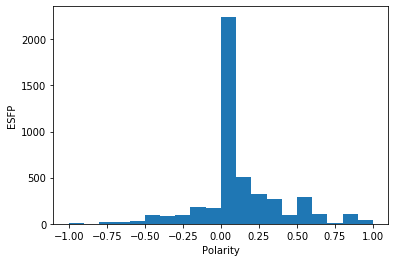

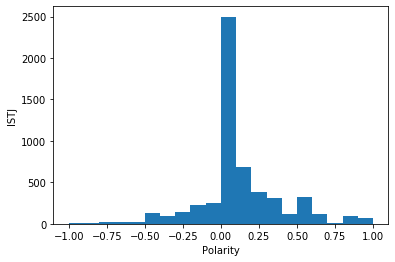

In [30]:
for data in personality_data:
    tag = data.loc[0,'Tag']
    plt.hist(data['polarity'], density=False, bins=20)
    plt.ylabel(tag)
    plt.xlabel('Polarity');
    plt.show(block = True)

/opt/anaconda3/lib/python3.7/site-packages/texthero/visualization.py:182: FutureWarning: The default value of regex will change from True to False in a future version.
  pattern, r"\2 \3"


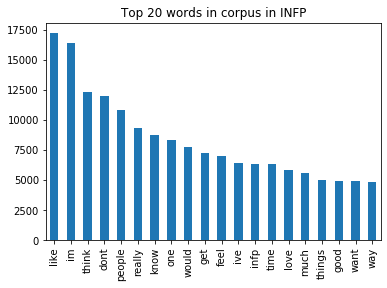

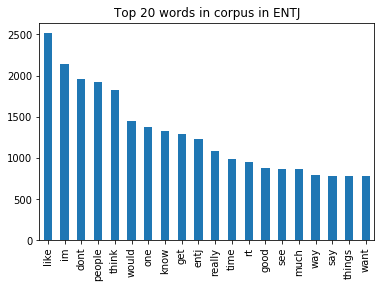

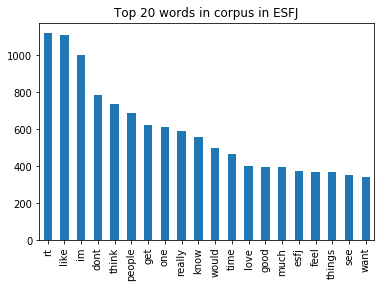

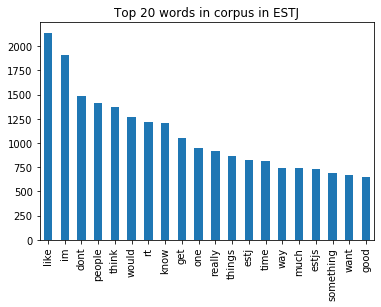

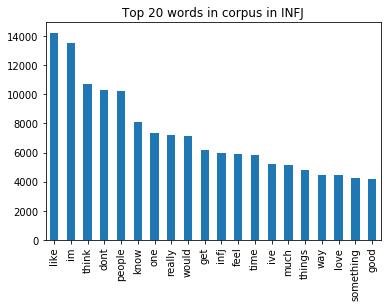

...

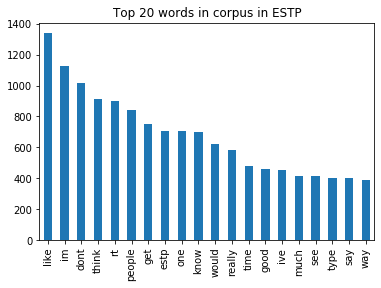

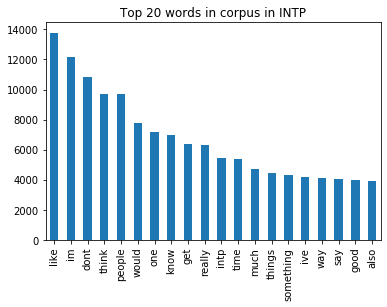

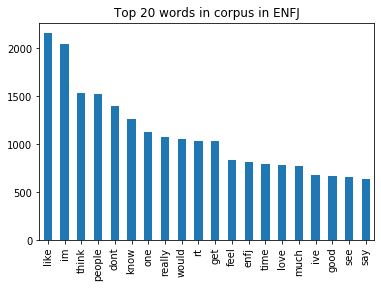

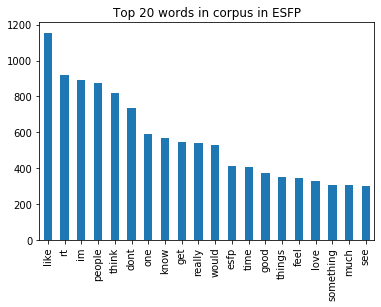

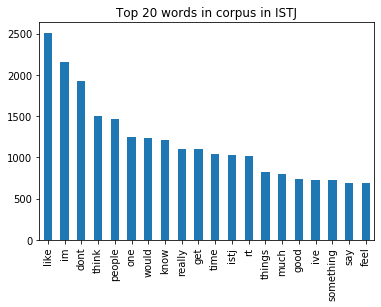

In [31]:
NUM_TOP_WORDS = 20
for data in personality_data:
    tag = data.loc[0,'Tag']
    top_20 = hero.visualization.top_words(data.loc[:, 'Cleaned_Text']).head(NUM_TOP_WORDS)
    top_20.plot.bar(rot=90, title="Top 20 words in corpus in " + tag)
    plt.show(block=True)

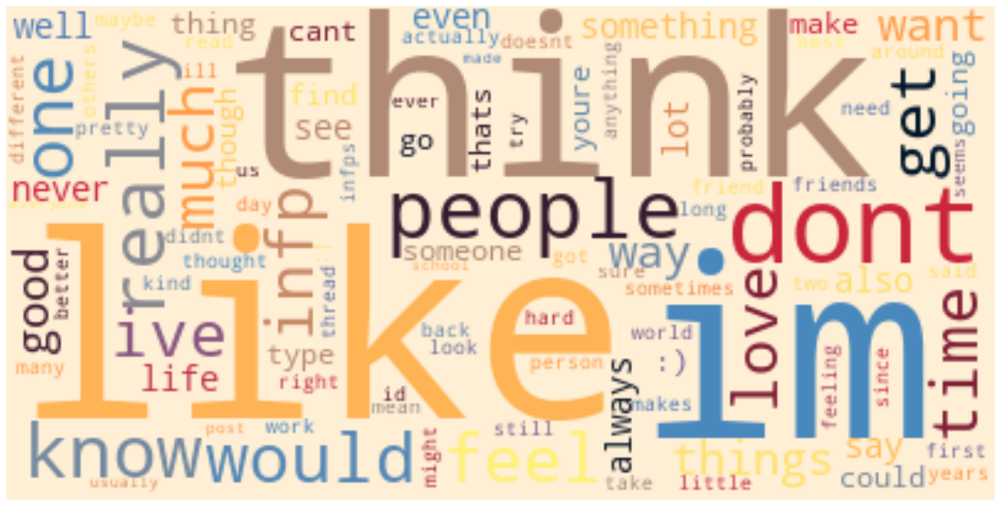

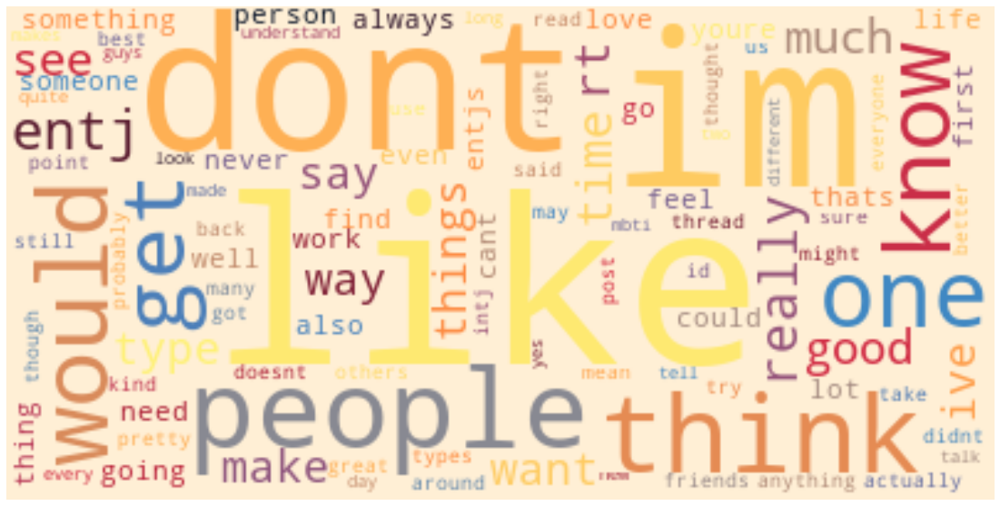

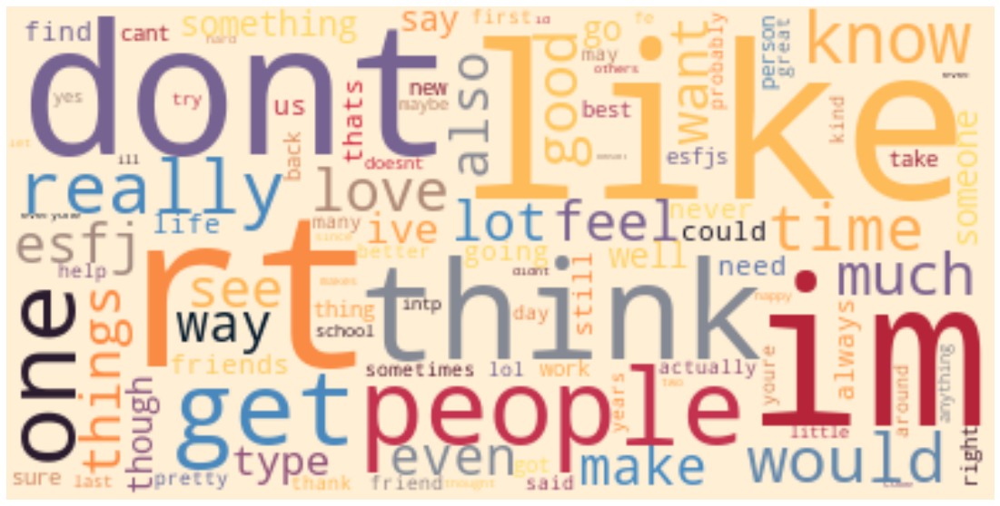

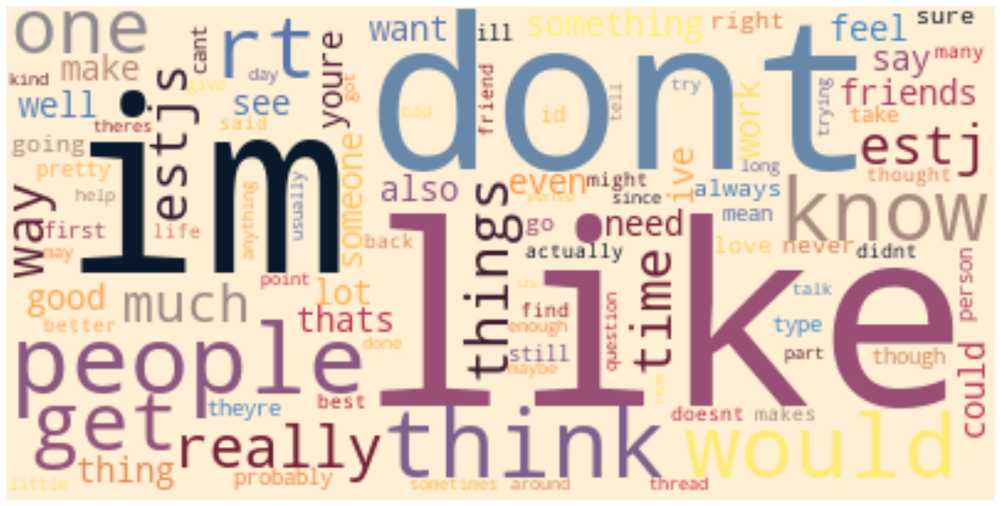

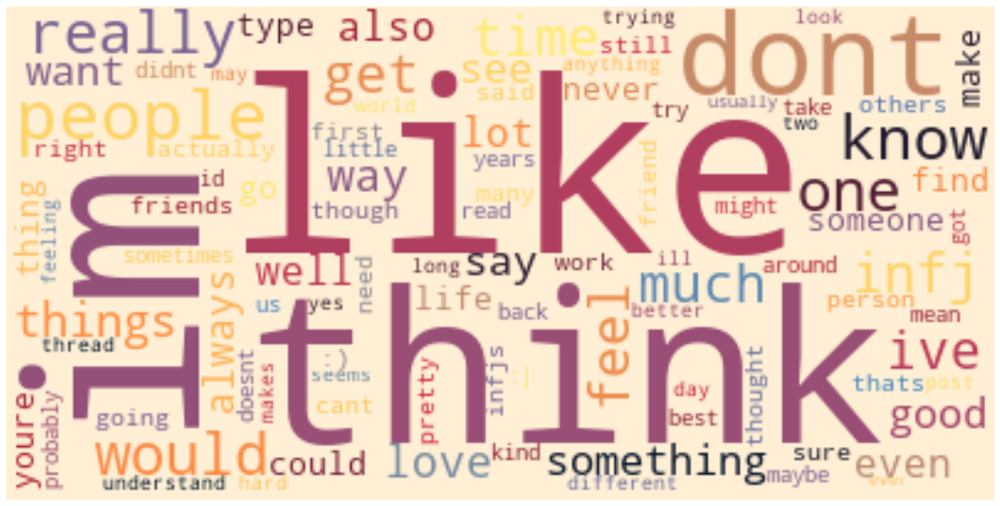

...

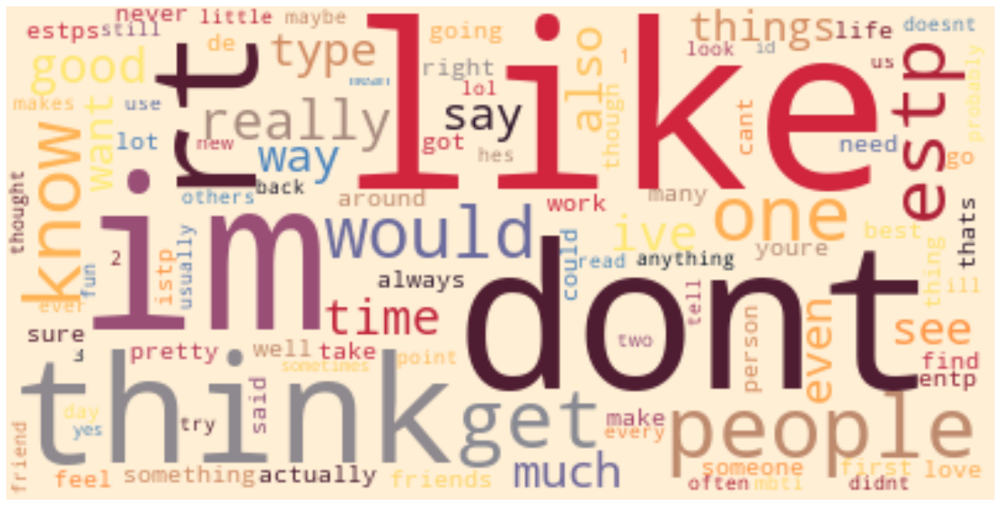

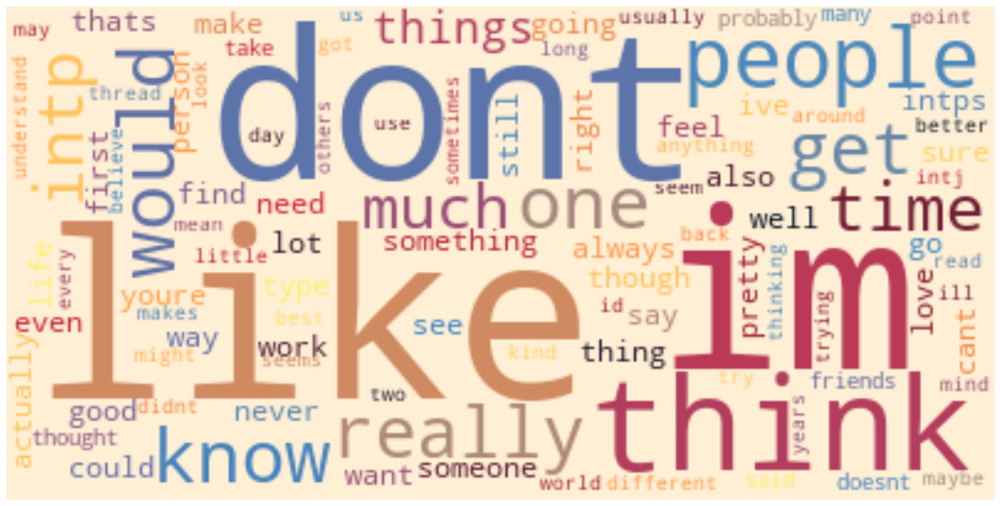

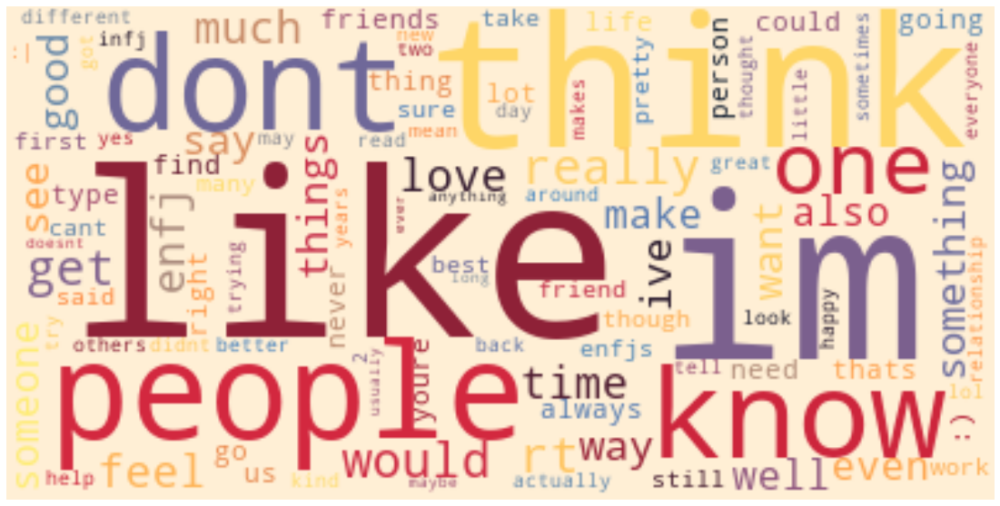

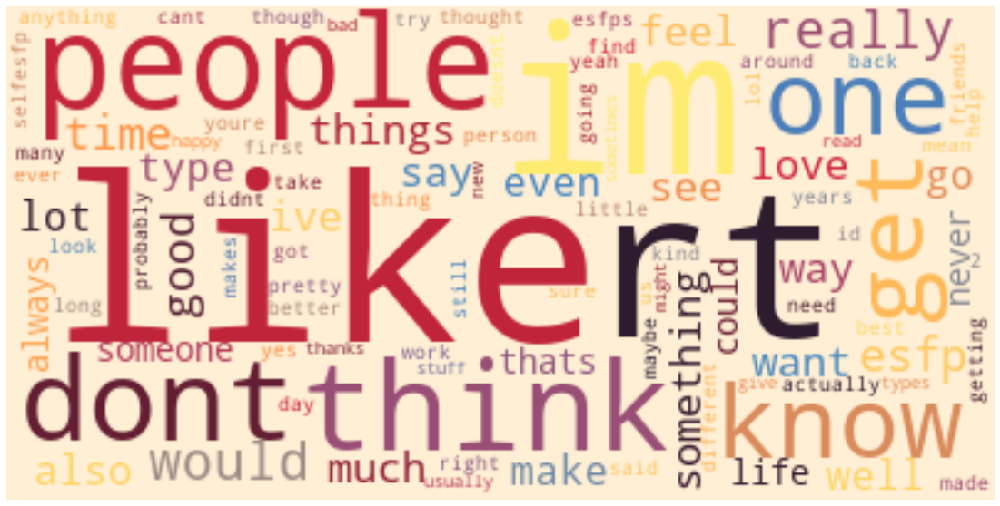

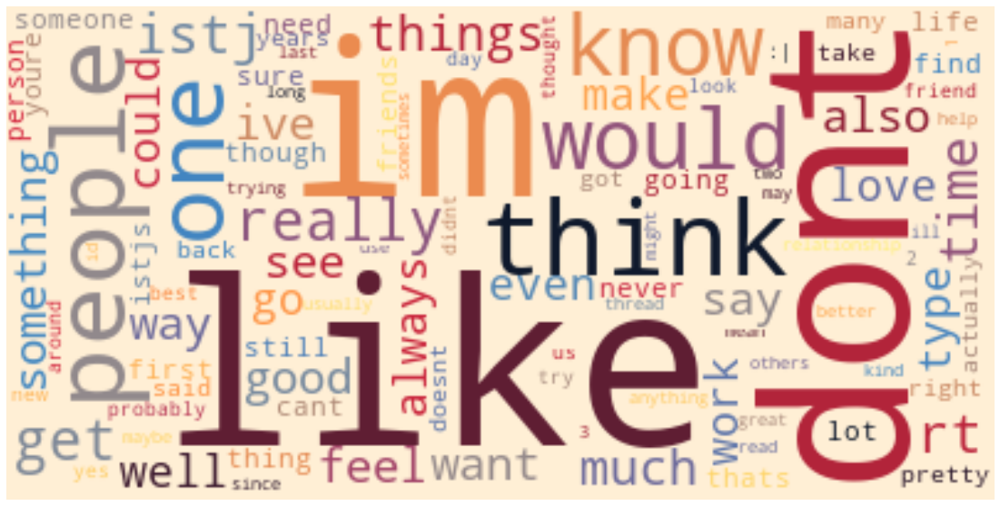

In [32]:
for data in personality_data:
    tag = data.loc[0,'Tag']
    hero.wordcloud(data.loc[:, 'Cleaned_Text'], max_words=100)